<left>
<table style="margin-top:0px; margin-left:0px;">
<tr>
  <td><img src="https://raw.githubusercontent.com/worm-portal/WORM-Figures/master/style/worm.png" alt="WORM" title="WORM" width=50/></td>
  <td><h1 style=font-size:30px>Activity Diagrams Part 2</h1><br />
</tr>
</table>
</left>

### What's covered in this demo?

- Plotting activity diagrams as a function of gas fugacity and aqueous activity
- Changing log activities of basis species
- Equilibration and balancing constraints

### Getting ready

Just like in Part 1 of the Activity Diagram demo, we will import the pyCHNOSZ Python package and the [WORM thermodynamic database](https://worm-portal.asu.edu/docs/database/).

In [1]:
from pyCHNOSZ import *
_ = thermo("WORM")

The WORM thermodynamic database has been loaded: 1694 aqueous, 1956 total species


Let's load a built-in set of basis species with the `basis` function. A full list of these built-in basis species sets can be found in the [CHNOSZ documentation for the function](https://chnosz.net/manual/basis.html).

In [2]:
basis("CHNOS")

,C,H,N,O,S,ispecies,logact,state
CO2,1.0,0.0,0.0,2.0,0.0,654,-3.0,aq
H2O,0.0,2.0,0.0,1.0,0.0,1,0.0,liq
NH3,0.0,3.0,1.0,0.0,0.0,64,-4.0,aq
H2S,0.0,2.0,0.0,0.0,1.0,65,-7.0,aq
O2,0.0,0.0,0.0,2.0,0.0,862,-80.0,gas


The resulting table shows how many of each element are in each of the basis species.

The table also has a column for `ispecies`, the index of the species in the WORM thermodynamic database.

The `logact` column specifies the log activity of the species. There are several different log activities assigned to the various basis species by default, but these can be changed. This demo will show how to do this further down.

Note that one of these basis species is given as "O2" in the "gas" state. This will be important later.

Now let's define our species of interest with the `species` function. For the sake of this demo, let's select amino acids:

In [3]:
species(["alanine", "arginine", "asparagine", "aspartic-acid",
         "cysteine", "glutamic-acid", "glutamine", "glycine",
         "histidine", "isoleucine", "leucine", "lysine",
         "methionine", "phenylalanine", "proline", "serine",
         "threonine", "tryptophan", "tyrosine", "valine"])

,CO2,H2O,NH3,H2S,O2,ispecies,logact,state,name
1,3.0,2.0,1.0,0.0,-3.0,972,-3.0,aq,alanine
2,6.0,1.0,4.0,0.0,-5.5,1789,-3.0,aq,arginine
3,4.0,1.0,2.0,0.0,-3.0,973,-3.0,aq,asparagine
4,4.0,2.0,1.0,0.0,-3.0,974,-3.0,aq,aspartic-acid
5,3.0,1.0,1.0,1.0,-2.5,1793,-3.0,aq,cysteine
6,5.0,3.0,1.0,0.0,-4.5,976,-3.0,aq,glutamic-acid
7,5.0,2.0,2.0,0.0,-4.5,975,-3.0,aq,glutamine
8,2.0,1.0,1.0,0.0,-1.5,977,-3.0,aq,glycine
9,6.0,0.0,3.0,0.0,-5.0,1796,-3.0,aq,histidine
10,6.0,5.0,1.0,0.0,-7.5,978,-3.0,aq,isoleucine


The big table tells you how the basis species can be used to write dissociation reactions for each of the species by providing reaction coefficients (where negative and positive coefficients are reactants and products, respectively). For example, it says the amino acid valine (at the bottom of the table) can be written to dissociate into basis species with the following reaction:

$$\text{valine} + 6 O_{2(g)} = 5 CO_2 + 4 H_2O + NH_3$$

Just like in the table produced by `basis`, there is an `ispecies` column for the species' database indices.

The `logact` column specifies the log activity of the species. By default it is set to -3 but this can be changed if desired.

Now that `basis` and `species` are defined, we can create an interactive activity diagram in the following cell by combining the `affinity` and `diagram` functions:

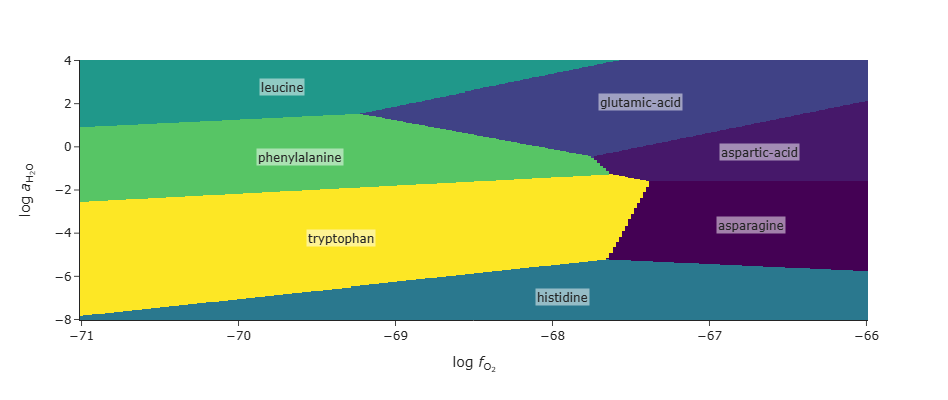

In [4]:
a = affinity(O2=[-71, -66], H2O=[-8, 4], T=25)
_ = diagram(a, width=500, height=400, interactive=True)

Let's pause for a moment and examine how this diagram was made.

Note that the two variables used in the diagram axes are $\text{log}f_{O_2}$ (the logarithm of the fugacity of oxygen gas) and $\text{log}a_{H_2O}$ (the logarithm of the activity of water). These were set up by specifying the basis species `O2` and `H2O` as parameters in the `affinity` function. Remember how `O2` was reported as a gas in the table produced by the `basis` function in an earlier cell? Gaseous basis species are plotted as fugacities instead of activities.

If you scroll back up and look at the output of the `basis` function, you'll see that the default log activity assigned to aqueous NH<sub>3</sub> is -4. In the cell below, the log activity of NH<sub>3</sub> is increased to -2:

In [5]:
basis("NH3", -2)

,C,H,N,O,S,ispecies,logact,state
CO2,1.0,0.0,0.0,2.0,0.0,654,-3.0,aq
H2O,0.0,2.0,0.0,1.0,0.0,1,0.0,liq
NH3,0.0,3.0,1.0,0.0,0.0,64,-2.0,aq
H2S,0.0,2.0,0.0,0.0,1.0,65,-7.0,aq
O2,0.0,0.0,0.0,2.0,0.0,862,-80.0,gas


Now let's plot the same system under these new conditions:

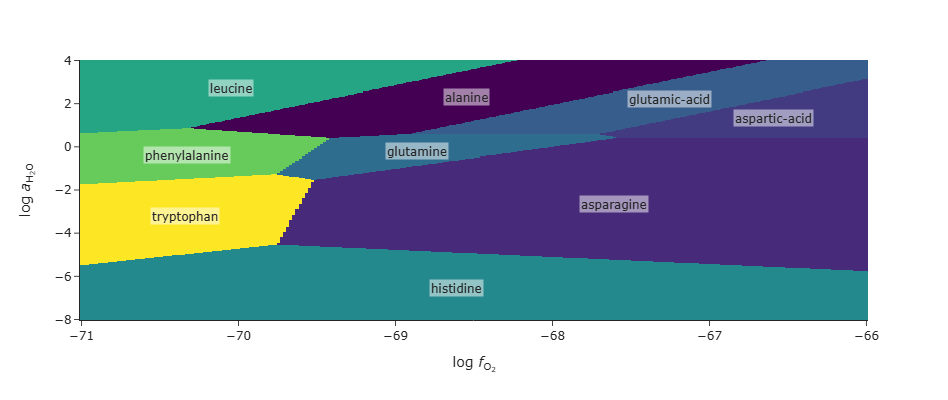

In [6]:
a = affinity(O2=[-71, -66], H2O=[-8, 4], T=25)
_ = diagram(a, width=500, height=400, interactive=True)

Increasing the amount of ammonia in the system from logact -4 to -2 has resulted in a visible shift in our diagram, and the appearance of regions corresponding to amino acids that were invisible before.

Try adjusting the log activities of various basis species to see what effect it has on the amino acid activity diagram.

You can also try adjusting which axes are plotted by setting parameters in the `affinity` function, as well as the temperature (T) and pressure (P):

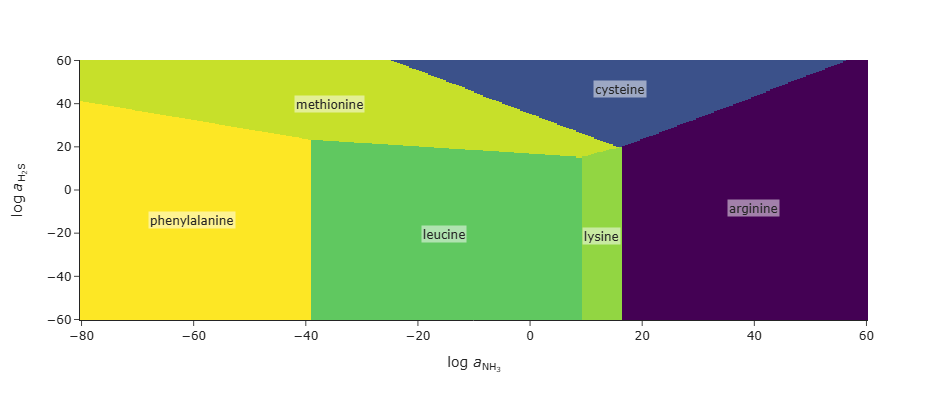

In [7]:
a = affinity(NH3=[-80, 60], H2S=[-60, 60], T=55, P=2000)
_ = diagram(a, width=500, height=400, interactive=True)

Recall that you can plot "one dimensional" activity diagrams by only specifying one axis in the `affinity` function. In the following plot, only the log activity of ammonia is allowed to vary while all other basis species activities are set according to their values defined by the `basis` function.

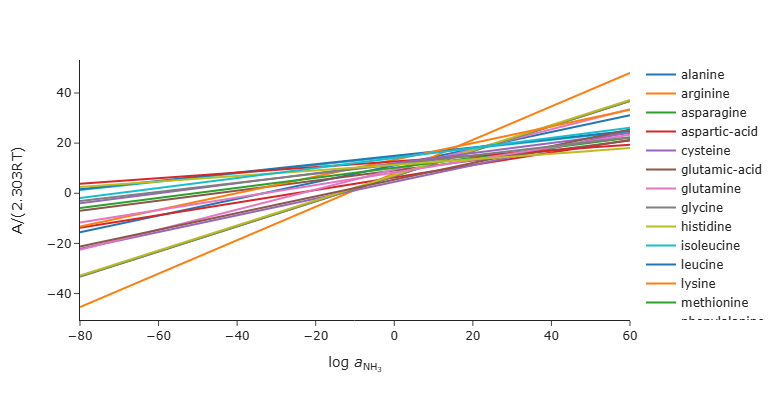

In [8]:
a = affinity(NH3=[-80, 60], T=55, P=2000)
_ = diagram(a, width=500, height=400, interactive=True)

The y-axis represents affinities of formation, reported in dimensionless units A/(2.303RT).

It is also possible to visualize predicted fractional abundances ("alpha") by setting `alpha=True` in a one-dimensional activity diagram:

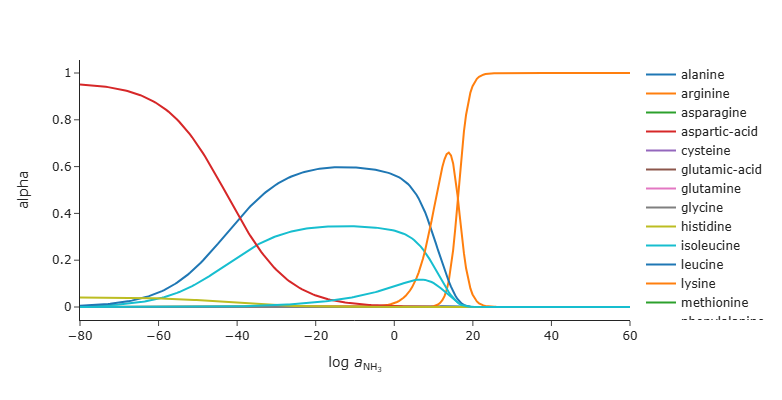

In [9]:
a = affinity(NH3=[-80, 60], T=55, P=2000)
_ = diagram(a, alpha=True, width=500, height=400, interactive=True)

Lastly, we can calculate activities by performing an equilibration on the output of `affinity`. This is done with the `equilibrate` function. Note that the output of `equilibrate` is fed into the `diagram` function:

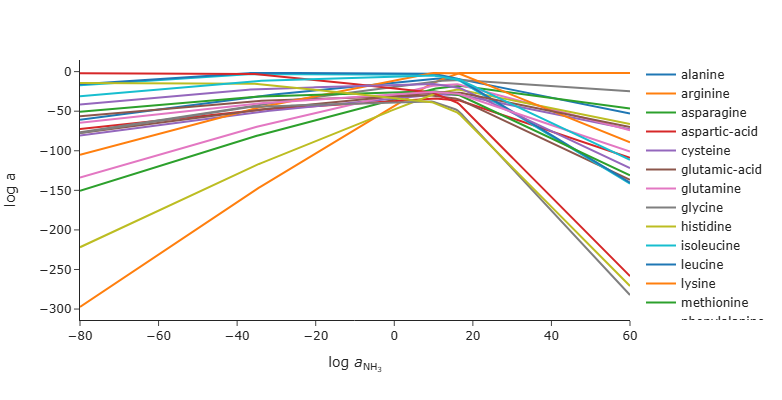

In [10]:
a = affinity(NH3=[-80, 60], T=55, P=2000)
e = equilibrate(a, balance="CO2") # balancing is explained below
_ = diagram(e, width=500, height=400, interactive=True)

The figure above represents a system where the amino acid species are in "metastable equilibrium". All *transformation reactions* among the amino acids are at equilibrium. In this case, a transformation reaction is where an amino acid reacts to transform into another amino acid. A transformation reaction can be written as the sum of the association and dissociation reactions of two amino acids. Let's write out a transformation reaction between valine and tyrosine, for example. We can start with the dissociation reactions provided by the `species` function, then flip tyrosine's reaction to get an association (formation) reaction:

$$\text{valine} + 6 O_{2(g)} = 5 CO_2 + 4 H_2O + NH_3$$

$$9 CO_2 + 4 H_2O + NH_3 = \text{tyrosine} + 9.5 O_2$$

Now we need some kind of balancing constraint. The `affinity` and `equilibrate` functions auto-select elements that are shared by the species of interest (e.g., amino acids) to use for balancing. Since carbon is shared by all amino acids, we can balance the reactions on CO<sub>2</sub> involved in their association or dissociation reactions. This balancing constraint can be set using the `balance` parameter in the `affinty` or `equilibrate functions`:

$$(\text{valine} + 6 O_{2(g)} = 5 CO_2 + 4 H_2O + NH_3)\times 9 CO_2$$

$$(9 CO_2 + 4 H_2O + NH_3 = \text{tyrosine} + 9.5 O_{2(g)})\times 5 CO_2$$

This gets us to:

$$9\cdot \text{valine} + 54 O_{2(g)} = 45 CO_2 + 36 H_2O + 9 NH_3$$

$$45 CO_2 + 20 H_2O + 5 NH_3 = 5\cdot \text{tyrosine} + 47.5 O_{2(g)}$$

Summing them gets us our transformation reaction between valine and tyrosine, balanced on moles of CO<sub>2</sub> in their respective formation reactions:

$$9\cdot \text{valine} + 6.5 O_{2(g)} = 5\cdot \text{tyrosine} + 16 H_2O + 4 NH_3 $$

The `equilibrate` function considers transformation reactions between all of our species of interest to solve for metastable equilibrium.

What if we would rather balance our reactions so that one amino acid transforms into another, instead of balancing on carbon? We can do this by setting the `balance` parameter to 1:

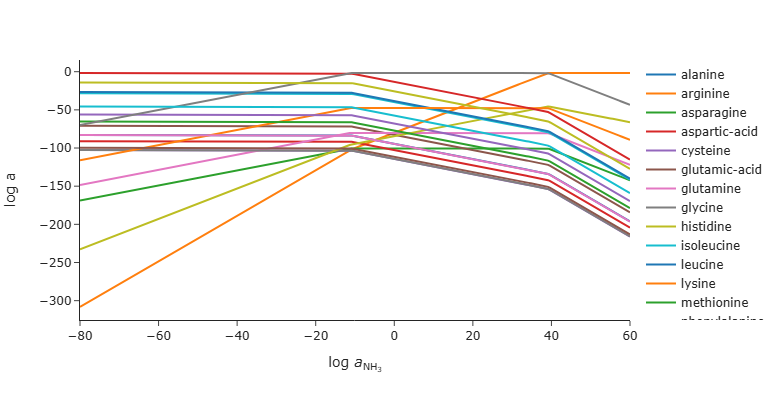

In [11]:
a = affinity(NH3=[-80, 60], T=55, P=2000)
e = equilibrate(a, balance=1)
_ = diagram(e, width=500, height=400, interactive=True)

Here's an example of deriving a transformation reaction between valine and tyrosine where the balance is set to 1. We start with our association/dissociation reactions like before:

$$\text{valine} + 6 O_{2(g)} = 5 CO_2 + 4 H_2O + NH_3$$

$$9\cdot CO_2 + 4 H_2O + NH_3 = \text{tyrosine} + 9.5 O_2$$

But instead of balancing on CO<sub>2</sub>, we simply sum the reactions so that one valine turns into one tyrosine:

$$\text{valine} + 4 CO_2 = \text{tyrosine} + 3.5 O_{2(g)}$$

This assumes that the system contains the activities of our basis species defined by `basis` and the species activities defined by `species`.

Since each of our amino acid species was initially set to a log activity of -3 by the `species` function, and since there are 20 amino acids, we can calculate the total log activity of all amino acids as $\text{log}(20\cdot 10^{-3})$:

In [12]:
import math
math.log10(20*10**-3)

-1.6989700043360187

Scroll back up to the plot created by the `balance=1` constraint and hover over the trend line for phenylalanine around log*a*<sub>NH$_3$</sub> ~ -80. What is the predicted log activity of phenylalanine? It is about -1.7! That is in close agreement to what we just calculated in the cell above for the total log activity of amino acids in the system!

Under low NH$_3$</sub> conditions, the amino acid phenylalanine is predicted to dominate. The next most abundant amino acid under these conditions is is tyrosine with a log activity of around -14. That is incredibly scarce, and the rest of the amino acids are even more scarce. Based on the difference in the activities of these amino acids, we can assume that phenylalanine is predicted to make up more than 99.99% of the amino acids in our metastable equilibrium system at log*a*<sub>NH$_3$</sub> ~ -80.

The lesson: the activities of all amino acids at any point along the NH$_3$ x-axis in the plot above will sum to approximately -1.7 because of our initial constraints on total amino acid activity in our system.

It's possible to add the `alpha` parameter to calculate fractional abundance after equilibration with `equilibrate`:

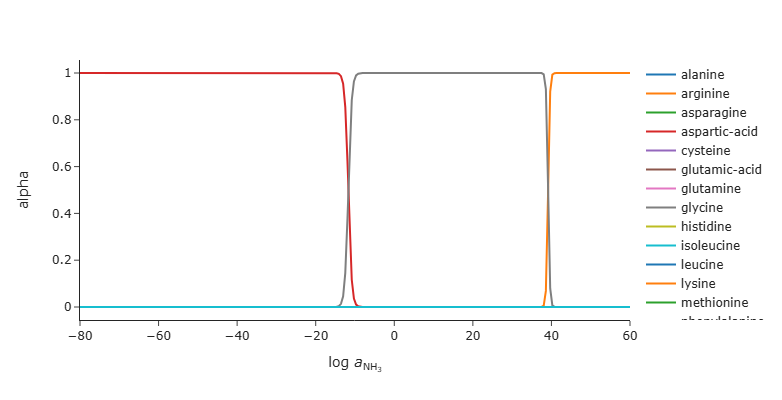

In [13]:
a = affinity(NH3=[-80, 60], T=55, P=2000)
e = equilibrate(a, balance=1)
_ = diagram(e, alpha=True, width=500, height=400, interactive=True)

End of demo

End of demo.